# Clustering Model for Music Genre Determination

In [ ]:
!pip install scikit-learn

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import math

from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.cluster import KMeans, AgglomerativeClustering

## Section 1: Data Pre-Processing

In [ ]:
#Convert csv to dataframe

df = pd.read_csv("music_genre.csv")

In [ ]:
#A look at the dataframe

df.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894,Röyksopp,Röyksopp's Night Out,27,0.00468,0.652,-1,0.941,0.79200,A#,0.115,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652,Thievery Corporation,The Shining Path,31,0.01270,0.622,218293,0.890,0.95000,D,0.124,-7.043,Minor,0.0300,115.002,4-Apr,0.531,Electronic
2,30097,Dillon Francis,Hurricane,28,0.00306,0.620,215613,0.755,0.01180,G#,0.534,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177,Dubloadz,Nitro,34,0.02540,0.774,166875,0.700,0.00253,C#,0.157,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907,What So Not,Divide & Conquer,32,0.00465,0.638,222369,0.587,0.90900,F#,0.157,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic


In [ ]:
df.describe()

,instance_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,valence
count,40000.000000,40000.000000,40000.000000,40000.000000,4.000000e+04,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,55874.349650,44.221100,0.306313,0.558355,2.212480e+05,0.599767,0.181434,0.193833,-9.144291,0.093536,0.456308
std,20739.825383,15.567862,0.341617,0.178539,1.285417e+05,0.264586,0.325375,0.161724,6.163661,0.101606,0.246988
min,20002.000000,0.000000,0.000000,0.059600,-1.000000e+00,0.000792,0.000000,0.009670,-47.046000,0.022300,0.000000
25%,37882.500000,34.000000,0.019600,0.442000,1.750000e+05,0.433000,0.000000,0.096900,-10.864000,0.036100,0.258000
50%,55962.000000,45.000000,0.144000,0.568000,2.195330e+05,0.643000,0.000155,0.126000,-7.288000,0.048900,0.448000
75%,73869.250000,56.000000,0.551000,0.687000,2.685515e+05,0.815250,0.153000,0.243000,-5.180000,0.097900,0.649000
max,91759.000000,99.000000,0.996000,0.986000,4.830606e+06,0.999000,0.996000,1.000000,3.744000,0.942000,0.990000


<Axes: xlabel='music_genre', ylabel='count'>

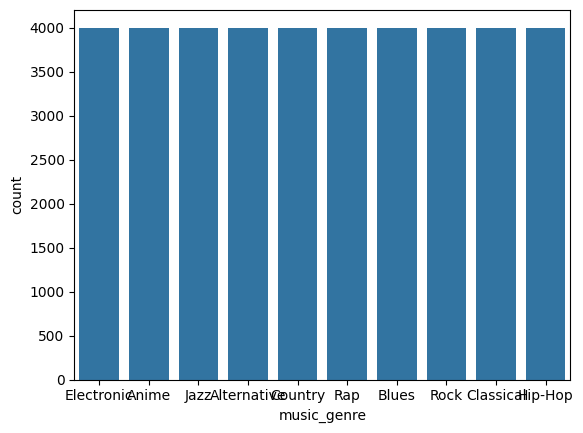

In [ ]:
sns.countplot(data=df, x='music_genre')

In [ ]:
from sklearn.preprocessing import LabelEncoder

#Encode non-numeric data

obj_list = ["key", "mode"]

for i in obj_list:
    le = LabelEncoder()
    le.fit(df[i])
    df[i] = le.transform(df[i])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       40000 non-null  int64  
 1   artist_name       40000 non-null  object 
 2   track_name        40000 non-null  object 
 3   popularity        40000 non-null  int64  
 4   acousticness      40000 non-null  float64
 5   danceability      40000 non-null  float64
 6   duration_ms       40000 non-null  int64  
 7   energy            40000 non-null  float64
 8   instrumentalness  40000 non-null  float64
 9   key               40000 non-null  int64  
 10  liveness          40000 non-null  float64
 11  loudness          40000 non-null  float64
 12  mode              40000 non-null  int64  
 13  speechiness       40000 non-null  float64
 14  tempo             40000 non-null  object 
 15  obtained_date     40000 non-null  object 
 16  valence           40000 non-null  float6

In [ ]:
df["tempo"] = pd.to_numeric(df["tempo"], errors='coerce')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       40000 non-null  int64  
 1   artist_name       40000 non-null  object 
 2   track_name        40000 non-null  object 
 3   popularity        40000 non-null  int64  
 4   acousticness      40000 non-null  float64
 5   danceability      40000 non-null  float64
 6   duration_ms       40000 non-null  int64  
 7   energy            40000 non-null  float64
 8   instrumentalness  40000 non-null  float64
 9   key               40000 non-null  int64  
 10  liveness          40000 non-null  float64
 11  loudness          40000 non-null  float64
 12  mode              40000 non-null  int64  
 13  speechiness       40000 non-null  float64
 14  tempo             36020 non-null  float64
 15  obtained_date     40000 non-null  object 
 16  valence           40000 non-null  float6

In [ ]:
df.isna().sum()

instance_id            0
artist_name            0
track_name             0
popularity             0
acousticness           0
danceability           0
duration_ms            0
energy                 0
instrumentalness       0
key                    0
liveness               0
loudness               0
mode                   0
speechiness            0
tempo               3980
obtained_date          0
valence                0
music_genre            0
dtype: int64

In [ ]:
df = df.dropna(axis=0)

In [ ]:
#Remove ID, Artist, Obtained Date, and Track Name columns as they are either irrelevant, removed Music Genre as it is the label
genres = df['music_genre']

df = df.drop(columns=['instance_id', 'artist_name', 'track_name', 'obtained_date', 'music_genre'], axis=1)

df.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence
0,27,0.00468,0.652,-1,0.941,0.79200,1,0.115,-5.201,1,0.0748,100.889,0.759
1,31,0.01270,0.622,218293,0.890,0.95000,5,0.124,-7.043,1,0.0300,115.002,0.531
2,28,0.00306,0.620,215613,0.755,0.01180,11,0.534,-4.617,0,0.0345,127.994,0.333
3,34,0.02540,0.774,166875,0.700,0.00253,4,0.157,-4.498,0,0.2390,128.014,0.270
4,32,0.00465,0.638,222369,0.587,0.90900,9,0.157,-6.266,0,0.0413,145.036,0.323


<Axes: >

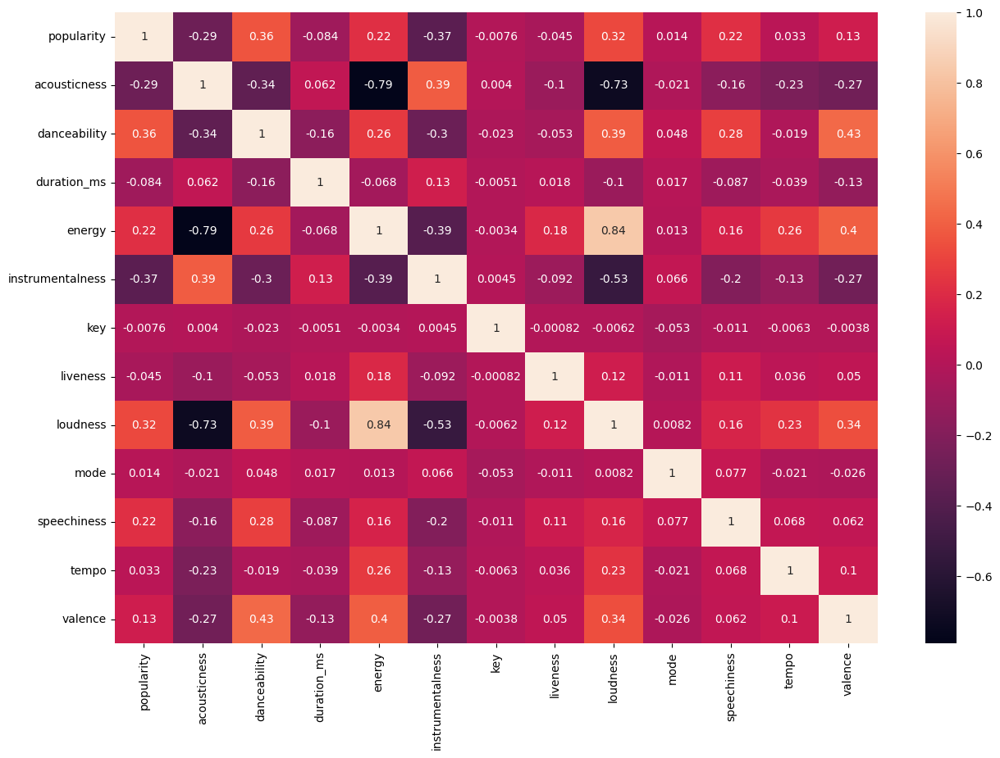

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(numeric_only = True), annot=True)

In [ ]:
X = df

In [ ]:
kmeans = KMeans(n_clusters = 10, random_state = 0, n_init= 10).fit(X)

In [ ]:
y = kmeans.fit_predict(X)

In [ ]:
df['cluster'] = y

In [ ]:
df.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
0,27,0.00468,0.652,-1,0.941,0.79200,1,0.115,-5.201,1,0.0748,100.889,0.759,0
1,31,0.01270,0.622,218293,0.890,0.95000,5,0.124,-7.043,1,0.0300,115.002,0.531,3
2,28,0.00306,0.620,215613,0.755,0.01180,11,0.534,-4.617,0,0.0345,127.994,0.333,3
3,34,0.02540,0.774,166875,0.700,0.00253,4,0.157,-4.498,0,0.2390,128.014,0.270,6
4,32,0.00465,0.638,222369,0.587,0.90900,9,0.157,-6.266,0,0.0413,145.036,0.323,3


<Axes: xlabel='popularity', ylabel='energy'>

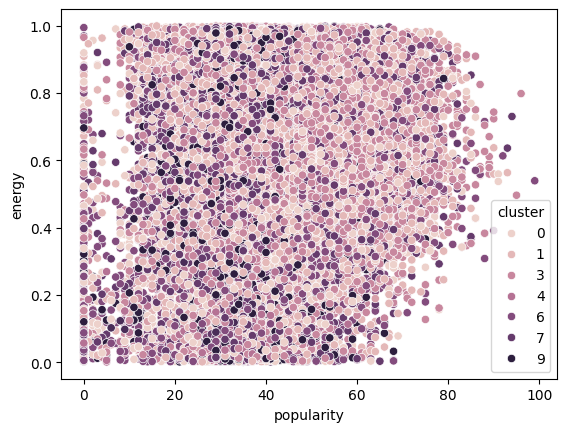

In [ ]:
sns.scatterplot(x = df['popularity'], y = df['energy'], hue=df['cluster'])

In [ ]:
df.loc[df['cluster'] == 9].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.0
mean,38.050311,0.433956,0.468237,410996.459582,0.479554,0.399028,5.306388,0.205249,-12.790259,0.395704,0.068734,115.903297,0.343895,9.0
std,13.749219,0.389703,0.188484,34438.507608,0.291581,0.388994,3.445597,0.203724,7.228893,0.489140,0.078718,30.371895,0.242775,0.0
min,0.000000,0.000007,0.060700,362667.000000,0.000943,0.000000,0.000000,0.025800,-42.012000,0.000000,0.023800,44.974000,0.026200,9.0
25%,30.000000,0.044000,0.329000,381481.000000,0.214000,0.002950,3.000000,0.092000,-16.842000,0.000000,0.036500,91.316000,0.131000,9.0
50%,38.000000,0.321000,0.461000,403333.000000,0.500000,0.258000,5.000000,0.116000,-10.723000,0.000000,0.044000,115.509000,0.304000,9.0
75%,47.000000,0.893000,0.607000,437067.000000,0.715000,0.844000,8.000000,0.230000,-7.334000,1.000000,0.061800,136.071000,0.518000,9.0
max,79.000000,0.996000,0.947000,483627.000000,0.998000,0.978000,11.000000,0.985000,0.584000,1.000000,0.828000,213.038000,0.973000,9.0


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_mdl = pca.fit_transform(X)
pca_df = pd.DataFrame(pca_mdl)

<Axes: xlabel='0', ylabel='1'>

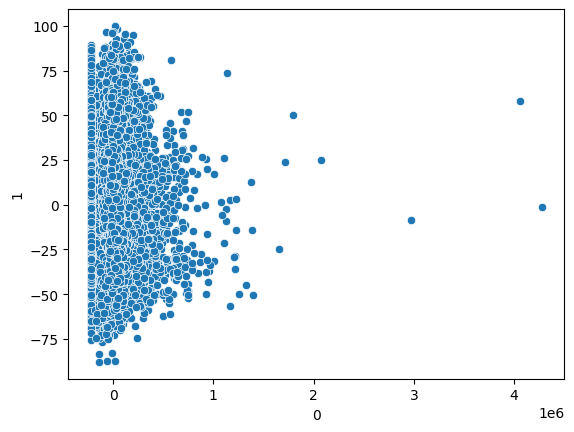

In [ ]:
sns.scatterplot(x = pca_df[0], y = pca_df[1])

In [ ]:
y_df = pd.DataFrame(y, columns=['Cluster'])
new_df = pd.concat([df, y_df], axis=1)

In [ ]:
test_df = pd.concat([new_df, pca_df], axis = 1)

In [ ]:
import plotly.express as px

fig = px.scatter(test_df, x = 0, y = 1, color='Cluster', hover_data=test_df.columns)
fig.update_layout(xaxis_range=[-50,300])
fig.show()

In [ ]:
dend_df = df.sample(frac=0.2, replace=False, random_state=0)

In [ ]:
# import scipy.cluster.hierarchy as shc
# plt.figure(figsize=(10, 7))
# plt.title('Dendrogram')
# plt.ylabel('Euclidean distances')
# dend = shc.dendrogram(shc.linkage(dend_df, method='ward'))

In [ ]:
agglo = AgglomerativeClustering(n_clusters=10, metric='euclidean', linkage='ward')

In [ ]:
y_agglo = agglo.fit_predict(X)

<Axes: xlabel='0', ylabel='1'>

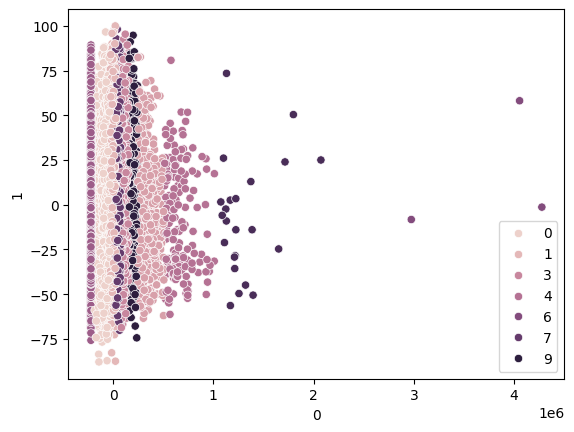

In [ ]:
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=y_agglo)

In [ ]:
y_a_df = pd.DataFrame(y_agglo, columns=['Cluster (Agglomerative)'])
new_a_df = pd.concat([df, y_a_df], axis=1)

In [ ]:
test_a_df = pd.concat([new_a_df, pca_df], axis = 1)

In [ ]:
import plotly.express as px

fig = px.scatter(test_a_df, x = 0, y = 1, color='Cluster (Agglomerative)', hover_data=test_a_df.columns)
fig.update_layout(xaxis_range=[-50,300])
fig.show()

<Axes: xlabel='Cluster', ylabel='music_genre'>

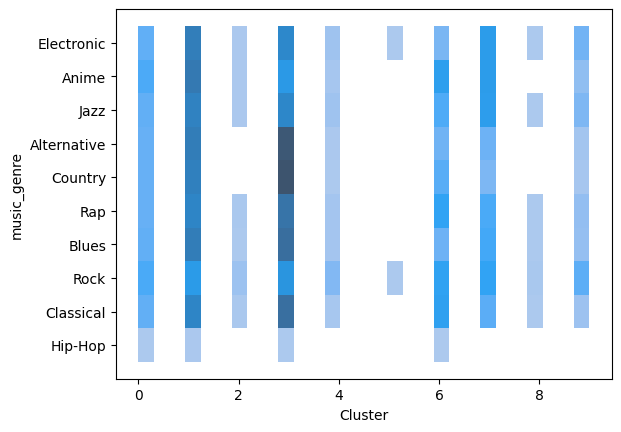

In [ ]:
sns.histplot(x = y_df["Cluster"], y = genres)

<Axes: xlabel='Cluster', ylabel='count'>

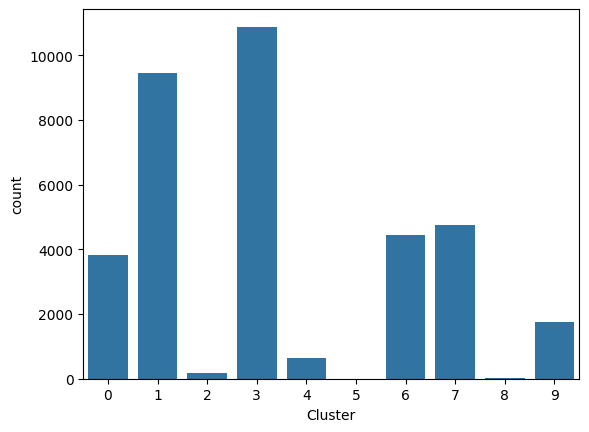

In [ ]:
sns.countplot(data=y_df, x='Cluster')

In [ ]:
df.loc[df['cluster'] == 0].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.000000,3815.0
mean,42.690433,0.334917,0.552898,3557.756488,0.575097,0.206236,5.413106,0.196705,-9.803027,0.349672,0.096850,119.915123,0.448854,0.0
std,16.566525,0.355868,0.182768,13688.958263,0.274038,0.343684,3.457774,0.165137,6.749606,0.476929,0.110934,30.721787,0.251655,0.0
min,0.000000,0.000001,0.062800,-1.000000,0.000953,0.000000,0.000000,0.022900,-43.407000,0.000000,0.022600,46.364000,0.000000,0.0
25%,32.000000,0.023700,0.431000,-1.000000,0.382000,0.000000,3.000000,0.096650,-11.888000,0.000000,0.036600,94.690000,0.234000,0.0
50%,44.000000,0.167000,0.563000,-1.000000,0.618000,0.000275,5.000000,0.128000,-7.641000,0.000000,0.049000,119.971000,0.435000,0.0
75%,55.000000,0.642000,0.686000,-1.000000,0.803000,0.297000,8.000000,0.244000,-5.324000,1.000000,0.099800,140.688500,0.649000,0.0
max,91.000000,0.996000,0.968000,71228.000000,0.998000,0.996000,11.000000,0.991000,1.610000,1.000000,0.942000,211.863000,0.990000,0.0


In [ ]:
df.loc[df['cluster'] == 1].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.000000,9470.0
mean,45.474446,0.241046,0.570775,250032.059556,0.652579,0.124897,5.346357,0.192487,-7.838325,0.364942,0.092689,121.157724,0.465582,1.0
std,15.028980,0.299359,0.165977,16108.955787,0.238311,0.274609,3.449314,0.156275,5.020541,0.481439,0.097486,30.335661,0.236596,0.0
min,0.000000,0.000002,0.063800,225000.000000,0.001060,0.000000,0.000000,0.016900,-40.942000,0.000000,0.022800,34.469000,0.024100,1.0
25%,35.000000,0.011700,0.465000,236093.000000,0.507000,0.000000,3.000000,0.097500,-9.297000,0.000000,0.035300,95.718750,0.281000,1.0
50%,47.000000,0.097250,0.576500,248400.000000,0.691000,0.000052,5.000000,0.128000,-6.591000,0.000000,0.049300,120.034500,0.456000,1.0
75%,56.000000,0.378750,0.687000,263146.000000,0.846000,0.023375,8.000000,0.247000,-4.771250,1.000000,0.100000,140.994250,0.647000,1.0
max,93.000000,0.996000,0.986000,282147.000000,0.999000,0.983000,11.000000,0.996000,1.342000,1.000000,0.918000,220.276000,0.978000,1.0


In [ ]:
df.loc[df['cluster'] == 2].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,176.000000,176.000000,176.000000,1.760000e+02,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.0
mean,29.727273,0.736639,0.288052,8.392334e+05,0.264515,0.644596,4.897727,0.209080,-18.391034,0.380682,0.051020,106.999176,0.191314,2.0
std,13.751449,0.349211,0.154441,9.934816e+04,0.267119,0.298875,3.166033,0.221413,6.888741,0.486940,0.039322,28.647385,0.191255,0.0
min,0.000000,0.000031,0.061800,7.020000e+05,0.003360,0.000000,0.000000,0.036500,-42.320000,0.000000,0.029100,53.813000,0.032200,2.0
25%,24.000000,0.644000,0.177750,7.522970e+05,0.068225,0.493000,3.000000,0.091175,-23.377000,0.000000,0.037950,81.021500,0.046650,2.0
50%,31.000000,0.922500,0.266000,8.282800e+05,0.140000,0.770500,5.000000,0.111500,-19.006000,0.000000,0.041950,105.793000,0.108500,2.0
75%,37.000000,0.967250,0.342500,9.107630e+05,0.422000,0.882000,7.000000,0.198250,-13.469500,1.000000,0.048275,130.707000,0.255250,2.0
max,65.000000,0.994000,0.889000,1.108495e+06,0.964000,0.943000,11.000000,0.970000,-3.078000,1.000000,0.395000,194.957000,0.852000,2.0


In [ ]:
df.loc[df['cluster'] == 3].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.000000,10888.0
mean,47.514879,0.256179,0.587781,199608.797024,0.641019,0.103036,5.356539,0.191017,-7.864494,0.340191,0.098585,121.432744,0.492927,3.0
std,14.504047,0.310297,0.163572,15394.616879,0.242223,0.255236,3.446236,0.149601,5.070843,0.473795,0.102558,30.312441,0.233763,0.0
min,0.000000,0.000001,0.061700,169493.000000,0.001080,0.000000,0.000000,0.017300,-43.135000,0.000000,0.022300,37.114000,0.027300,3.0
25%,38.000000,0.016200,0.487000,187000.000000,0.496000,0.000000,3.000000,0.098100,-9.306250,0.000000,0.036300,96.012000,0.315000,3.0
50%,49.000000,0.105500,0.595000,200453.000000,0.680000,0.000013,5.000000,0.129000,-6.483000,0.000000,0.052300,120.177500,0.491000,3.0
75%,58.000000,0.409250,0.701000,212867.000000,0.836000,0.006060,8.000000,0.245000,-4.793000,1.000000,0.112000,143.920250,0.673000,3.0
max,96.000000,0.996000,0.980000,224987.000000,0.999000,0.982000,11.000000,0.990000,1.893000,1.000000,0.922000,216.029000,0.985000,3.0


In [ ]:
df.loc[df['cluster'] == 4].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.0
mean,35.218989,0.576487,0.395006,556298.632466,0.390545,0.515853,5.381317,0.214910,-15.523502,0.395100,0.055502,111.635634,0.284669,4.0
std,12.987706,0.400523,0.184081,53595.618592,0.300692,0.369857,3.395245,0.221659,7.506006,0.489247,0.049141,27.435206,0.225694,0.0
min,0.000000,0.000010,0.061800,483763.000000,0.000795,0.000000,0.000000,0.023700,-44.406000,0.000000,0.025200,54.064000,0.023400,4.0
25%,29.000000,0.110000,0.263000,510573.000000,0.101000,0.062100,3.000000,0.092700,-21.230000,0.000000,0.037300,90.211000,0.087200,4.0
50%,35.000000,0.766000,0.373000,545813.000000,0.353000,0.649000,5.000000,0.115000,-13.752000,0.000000,0.043000,110.931000,0.228000,4.0
75%,42.000000,0.955000,0.497000,590000.000000,0.646000,0.869000,8.000000,0.230000,-9.279000,1.000000,0.052700,129.623000,0.434000,4.0
max,77.000000,0.995000,0.912000,697173.000000,0.994000,0.966000,11.000000,0.978000,-3.131000,1.000000,0.543000,199.974000,0.935000,4.0


In [ ]:
df.loc[df['cluster'] == 5].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,3.000000,3.000000,3.000000,3.000000e+00,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.0
mean,32.333333,0.449997,0.348333,3.989811e+06,0.454667,0.094733,4.666667,0.305800,-13.637333,0.333333,0.095067,99.597000,0.177267,5.0
std,5.686241,0.413560,0.070188,6.968427e+05,0.314416,0.023023,2.516611,0.280304,10.742621,0.577350,0.059719,33.681842,0.117559,0.0
min,26.000000,0.002990,0.271000,3.195440e+06,0.150000,0.069700,2.000000,0.095400,-25.289000,0.000000,0.059000,76.868000,0.077800,5.0
25%,30.000000,0.265495,0.318500,3.735720e+06,0.293000,0.084600,3.500000,0.146700,-18.393000,0.000000,0.060600,80.249000,0.112400,5.0
50%,34.000000,0.528000,0.366000,4.276000e+06,0.436000,0.099500,5.000000,0.198000,-11.497000,0.000000,0.062200,83.630000,0.147000,5.0
75%,35.500000,0.673500,0.387000,4.386997e+06,0.607000,0.107250,6.000000,0.411000,-7.811500,0.500000,0.113100,110.961500,0.227000,5.0
max,37.000000,0.819000,0.408000,4.497994e+06,0.778000,0.115000,7.000000,0.624000,-4.126000,1.000000,0.164000,138.293000,0.307000,5.0


In [ ]:
df.loc[df['cluster'] == 6].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.000000,4461.0
mean,42.113427,0.427774,0.567899,139003.327505,0.506054,0.261093,5.376821,0.189261,-11.205753,0.354181,0.111966,118.058646,0.475999,6.0
std,17.358865,0.372386,0.195175,24684.669839,0.274152,0.381406,3.465188,0.146579,7.168767,0.478318,0.119045,31.994429,0.267875,0.0
min,0.000000,0.000000,0.059600,71427.000000,0.000792,0.000000,0.000000,0.009670,-47.046000,0.000000,0.022600,34.347000,0.020500,6.0
25%,31.000000,0.054100,0.433000,123400.000000,0.286000,0.000000,3.000000,0.100000,-13.731000,0.000000,0.038300,91.005000,0.254000,6.0
50%,43.000000,0.329000,0.587000,145533.000000,0.528000,0.000422,5.000000,0.127000,-9.140000,0.000000,0.054200,117.014000,0.474000,6.0
75%,55.000000,0.821000,0.716000,159718.000000,0.723000,0.689000,8.000000,0.237000,-6.361000,1.000000,0.134000,140.038000,0.690000,6.0
max,99.000000,0.996000,0.978000,169489.000000,0.998000,0.994000,11.000000,0.980000,1.949000,1.000000,0.877000,217.538000,0.989000,6.0


In [ ]:
df.loc[df['cluster'] == 7].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,4750.00000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.000000,4750.0
mean,41.90800,0.313671,0.533003,314020.790316,0.594462,0.231545,5.428842,0.197050,-9.595547,0.374947,0.081521,119.171370,0.420824,7.0
std,15.17729,0.342538,0.177019,22083.611189,0.264445,0.349634,3.523511,0.178373,6.132693,0.484160,0.090521,30.838197,0.244857,0.0
min,0.00000,0.000002,0.060000,282173.000000,0.001060,0.000000,0.000000,0.024800,-42.117000,0.000000,0.022800,49.934000,0.025900,7.0
25%,31.00000,0.020500,0.415000,294773.000000,0.429000,0.000003,3.000000,0.094225,-11.395250,0.000000,0.034600,94.023750,0.214000,7.0
50%,41.00000,0.157000,0.539000,310893.000000,0.638000,0.002565,5.000000,0.122000,-7.808000,0.000000,0.044900,117.985000,0.398000,7.0
75%,53.00000,0.567750,0.661750,330729.750000,0.809000,0.477000,9.000000,0.238000,-5.612250,1.000000,0.077600,139.965250,0.611000,7.0
max,94.00000,0.996000,0.967000,362533.000000,0.997000,0.987000,11.000000,1.000000,3.744000,1.000000,0.939000,213.788000,0.977000,7.0


In [ ]:
df.loc[df['cluster'] == 8].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,35.000000,35.000000,35.00000,3.500000e+01,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.0
mean,27.000000,0.794543,0.21108,1.408426e+06,0.203100,0.686585,5.800000,0.197537,-18.782086,0.371429,0.043091,98.123400,0.103454,8.0
std,12.433352,0.244327,0.12350,2.727905e+05,0.203252,0.288317,2.752539,0.217999,5.994633,0.490241,0.010834,30.116156,0.125761,0.0
min,0.000000,0.117000,0.06160,1.142280e+06,0.017900,0.006180,0.000000,0.044700,-39.109000,0.000000,0.031600,52.753000,0.027400,8.0
25%,21.000000,0.740000,0.10600,1.184274e+06,0.087150,0.621500,4.000000,0.084750,-20.121500,0.000000,0.037950,75.839500,0.036550,8.0
50%,29.000000,0.913000,0.17500,1.350400e+06,0.123000,0.835000,6.000000,0.110000,-18.957000,0.000000,0.039600,94.113000,0.044100,8.0
75%,33.500000,0.949000,0.27950,1.461067e+06,0.196500,0.873500,8.000000,0.187500,-17.190500,1.000000,0.042050,116.443000,0.089950,8.0
max,52.000000,0.981000,0.51600,2.294000e+06,0.741000,0.943000,11.000000,0.942000,-8.987000,1.000000,0.086000,182.349000,0.579000,8.0


In [ ]:
df.loc[df['cluster'] == 9].describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,cluster
count,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.000000,1769.0
mean,38.050311,0.433956,0.468237,410996.459582,0.479554,0.399028,5.306388,0.205249,-12.790259,0.395704,0.068734,115.903297,0.343895,9.0
std,13.749219,0.389703,0.188484,34438.507608,0.291581,0.388994,3.445597,0.203724,7.228893,0.489140,0.078718,30.371895,0.242775,0.0
min,0.000000,0.000007,0.060700,362667.000000,0.000943,0.000000,0.000000,0.025800,-42.012000,0.000000,0.023800,44.974000,0.026200,9.0
25%,30.000000,0.044000,0.329000,381481.000000,0.214000,0.002950,3.000000,0.092000,-16.842000,0.000000,0.036500,91.316000,0.131000,9.0
50%,38.000000,0.321000,0.461000,403333.000000,0.500000,0.258000,5.000000,0.116000,-10.723000,0.000000,0.044000,115.509000,0.304000,9.0
75%,47.000000,0.893000,0.607000,437067.000000,0.715000,0.844000,8.000000,0.230000,-7.334000,1.000000,0.061800,136.071000,0.518000,9.0
max,79.000000,0.996000,0.947000,483627.000000,0.998000,0.978000,11.000000,0.985000,0.584000,1.000000,0.828000,213.038000,0.973000,9.0
